# Similarity Search  
Performed in this notebook:  
* Create indexer to retrieve similar images based on embedding space and nearest neighbors.  
* Create visualizations to see the embedding space, clustering, etc.  

## Setup

In [27]:
import pickle
import random
import warnings

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors

warnings.filterwarnings("ignore")

In [2]:
filenames = pickle.load(open("../training/data/filenames-caltech101-resnet.pkl", "rb"))
feature_list = pickle.load(open("../training/data/features-caltech101-resnet.pkl", "rb"))
num_images = len(filenames)

In [3]:
# Helper function to get the classname
def classname(str):
    return str.split("/")[-2]


# Helper function to get the classname and filename
def classname_filename(str):
    return str.split("/")[-2] + "/" + str.split("/")[-1]


# Helper functions to plot the nearest images given a query image
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(f"../{filename}"))
    plt.figure(figsize=(20, 10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) / columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + classname_filename(filenames[i]))
        else:
            ax.set_title(
                "Similar Image\n"
                + classname_filename(filenames[i])
                + "\nDistance: "
                + str(float("{0:.2f}".format(distances[i])))
            )
        plt.imshow(image)

## Basic Nearest Neighbors on full features

In [4]:
neighbors = NearestNeighbors(n_neighbors=5, algorithm="brute", metric="euclidean").fit(
    feature_list
)

distances, indices = neighbors.kneighbors([feature_list[0]])

Pull random images and see their closest neighbors.

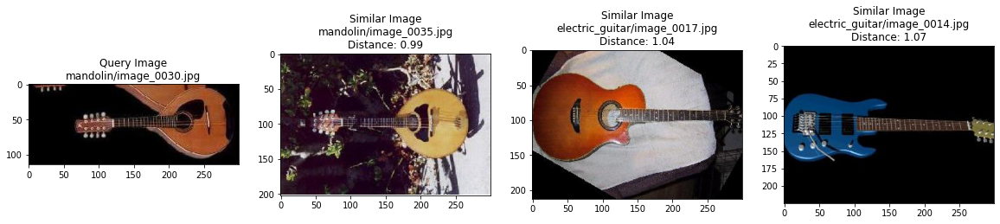

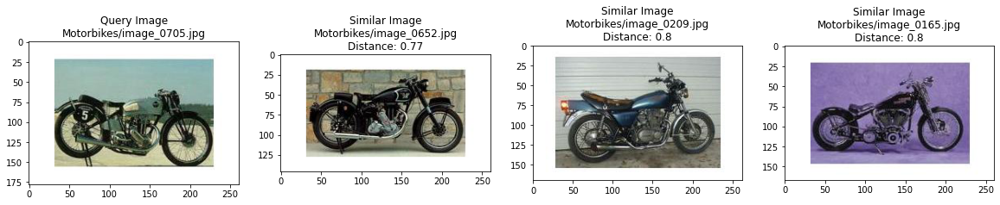

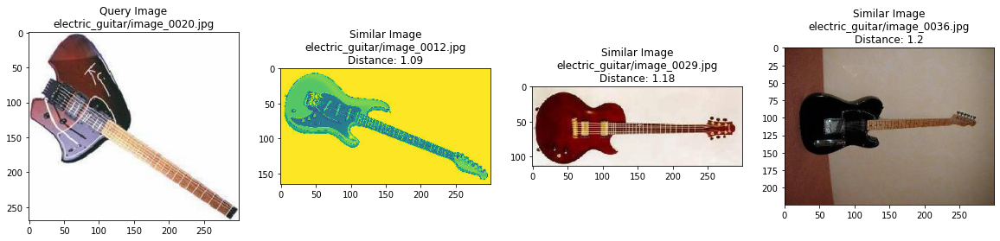

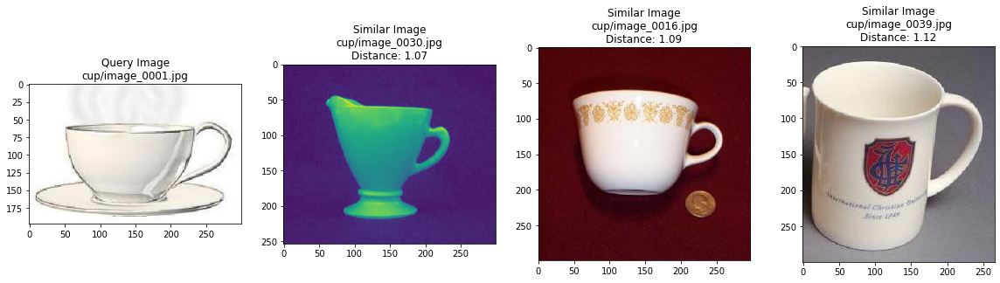

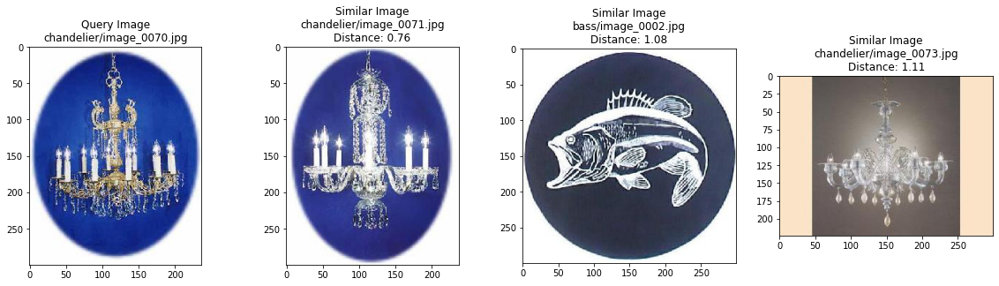

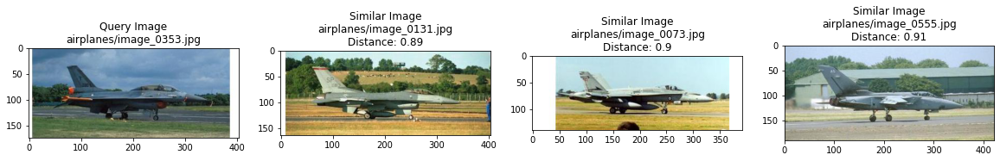

In [8]:
for _ in range(6):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors([feature_list[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + [
        filenames[indices[0][i]] for i in range(1, 4)
    ]
    plot_images(similar_image_paths, distances[0])

## t-SNE Visualization  
t-SNE is a common algorithm for visualizing high dimensional data.

In [9]:
neighbors = NearestNeighbors(
    n_neighbors=len(feature_list), algorithm="brute", metric="euclidean"
).fit(feature_list)

distances, indices = neighbors.kneighbors(feature_list)

In [10]:
selected_features = feature_list[:]
selected_filenames = filenames[:]

In [13]:
n_components = 2
verbose = 1
perplexity = 30
n_iter = 1000
metric = "euclidean"

tsne_results = TSNE(
    n_components=n_components,
    verbose=verbose,
    perplexity=perplexity,
    n_iter=n_iter,
    metric=metric,
).fit_transform(selected_features)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8677 samples in 0.485s...
[t-SNE] Computed neighbors for 8677 samples in 64.883s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8677
[t-SNE] Computed conditional probabilities for sample 2000 / 8677
[t-SNE] Computed conditional probabilities for sample 3000 / 8677
[t-SNE] Computed conditional probabilities for sample 4000 / 8677
[t-SNE] Computed conditional probabilities for sample 5000 / 8677
[t-SNE] Computed conditional probabilities for sample 6000 / 8677
[t-SNE] Computed conditional probabilities for sample 7000 / 8677
[t-SNE] Computed conditional probabilities for sample 8000 / 8677
[t-SNE] Computed conditional probabilities for sample 8677 / 8677
[t-SNE] Mean sigma: 0.255361
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.788788
[t-SNE] KL divergence after 1000 iterations: 1.251772


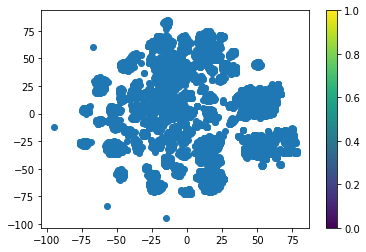

In [14]:
color_map = plt.cm.get_cmap("coolwarm")
scatter_plot = plt.scatter(
    tsne_results[:, 0], tsne_results[:, 1], cmap=color_map
)
plt.colorbar(scatter_plot)
plt.show()

In [15]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data


def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        image = Image.open(image_path)
        image.thumbnail((100, 100), Image.ANTIALIAS)
        img = OffsetImage(image, zoom=zoom)
        anno_box = AnnotationBbox(img, (x0, y0), xycoords="data", frameon=False)
        axis.add_artist(anno_box)
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()

In [16]:
def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)
    plt.show()

In [ ]:
for i in range(len(selected_filenames)):
    selected_filenames[i] = f"../{selected_filenames[i]}"

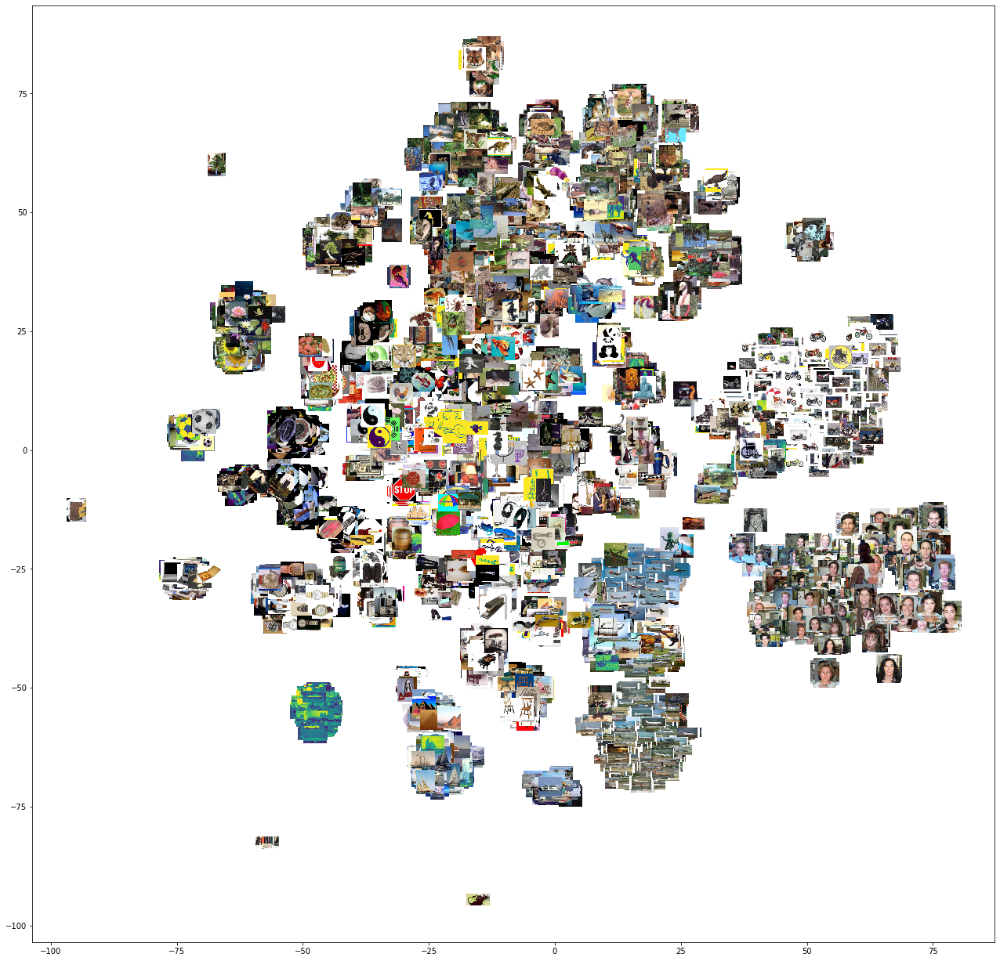

In [23]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

In [24]:
def tsne_to_grid_plotter_manual(x, y, selected_filenames):
    S = 2000
    s = 100
    x = (x - min(x)) / (max(x) - min(x))
    y = (y - min(y)) / (max(y) - min(y))
    x_values = []
    y_values = []
    filename_plot = []
    x_y_dict = {}
    for i, image_path in enumerate(selected_filenames):
        a = np.ceil(x[i] * (S - s))
        b = np.ceil(y[i] * (S - s))
        a = int(a - np.mod(a, s))
        b = int(b - np.mod(b, s))
        if str(a) + "|" + str(b) in x_y_dict:
            continue
        x_y_dict[str(a) + "|" + str(b)] = 1
        x_values.append(a)
        y_values.append(b)
        filename_plot.append(image_path)
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x_values, y_values, filename_plot, zoom=0.58, axis=axis)
    plt.show()

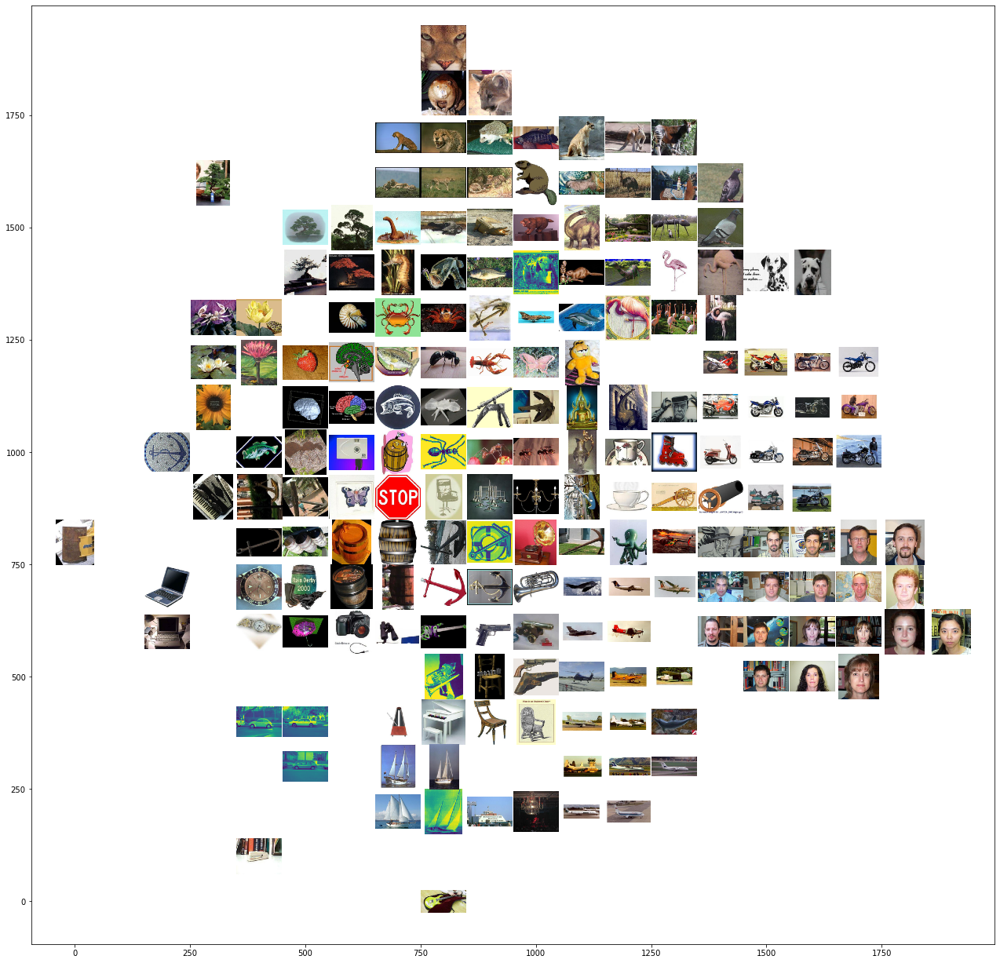

In [25]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

## Principal Component Analysis (PCA)  
PCA is commonly used for dimensionality reduction while maintaining a threshold of variance. This let's us compress our features down to 100 dimensions (instead of thousands or tens of thousands)

In [28]:
num_feature_dimensions = 100
pca = PCA(n_components=num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)

In [30]:
neighbors = NearestNeighbors(n_neighbors=5, algorithm="brute", metric="euclidean").fit(
    feature_list_compressed
)
distances, indices = neighbors.kneighbors([feature_list_compressed[0]])

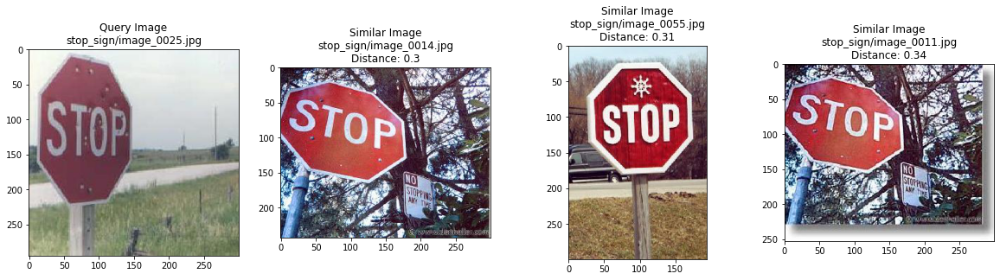

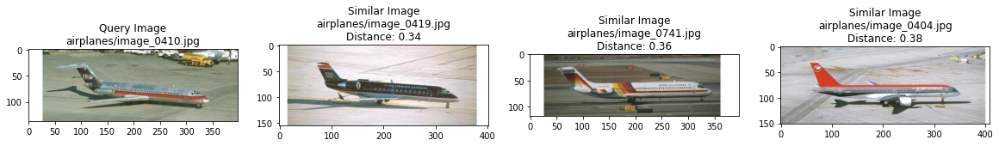

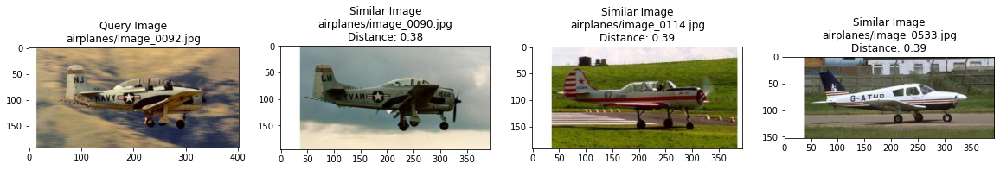

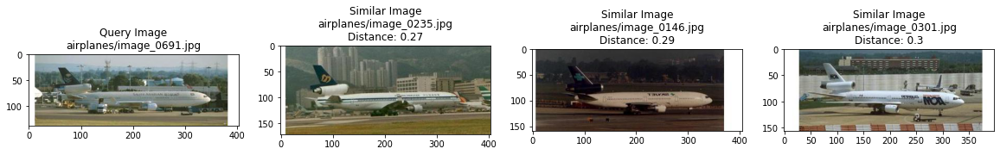

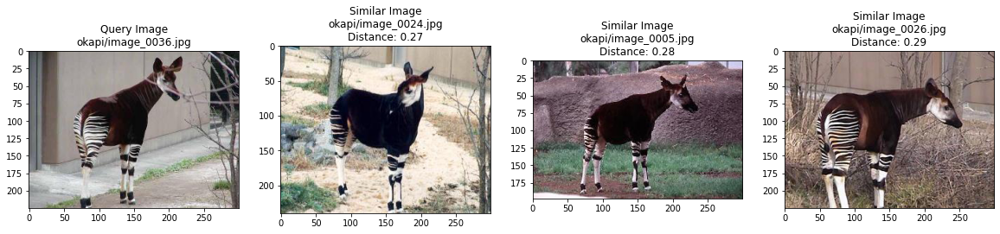

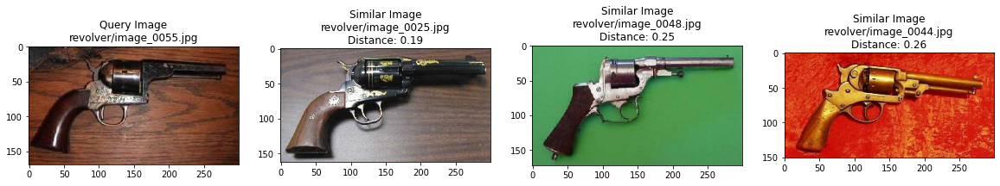

In [31]:
for _ in range(6):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors(
        [feature_list_compressed[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])

In [32]:
selected_features = feature_list_compressed[:]

In [33]:
tsne_results = TSNE(n_components=2, verbose=1, metric="euclidean").fit_transform(
    selected_features
)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8677 samples in 0.001s...
[t-SNE] Computed neighbors for 8677 samples in 1.505s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8677
[t-SNE] Computed conditional probabilities for sample 2000 / 8677
[t-SNE] Computed conditional probabilities for sample 3000 / 8677
[t-SNE] Computed conditional probabilities for sample 4000 / 8677
[t-SNE] Computed conditional probabilities for sample 5000 / 8677
[t-SNE] Computed conditional probabilities for sample 6000 / 8677
[t-SNE] Computed conditional probabilities for sample 7000 / 8677
[t-SNE] Computed conditional probabilities for sample 8000 / 8677
[t-SNE] Computed conditional probabilities for sample 8677 / 8677
[t-SNE] Mean sigma: 0.152959
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.992386
[t-SNE] KL divergence after 1000 iterations: 1.086052


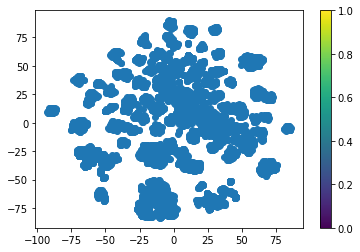

In [34]:
color_map = plt.cm.get_cmap("coolwarm")
scatter_plot = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()

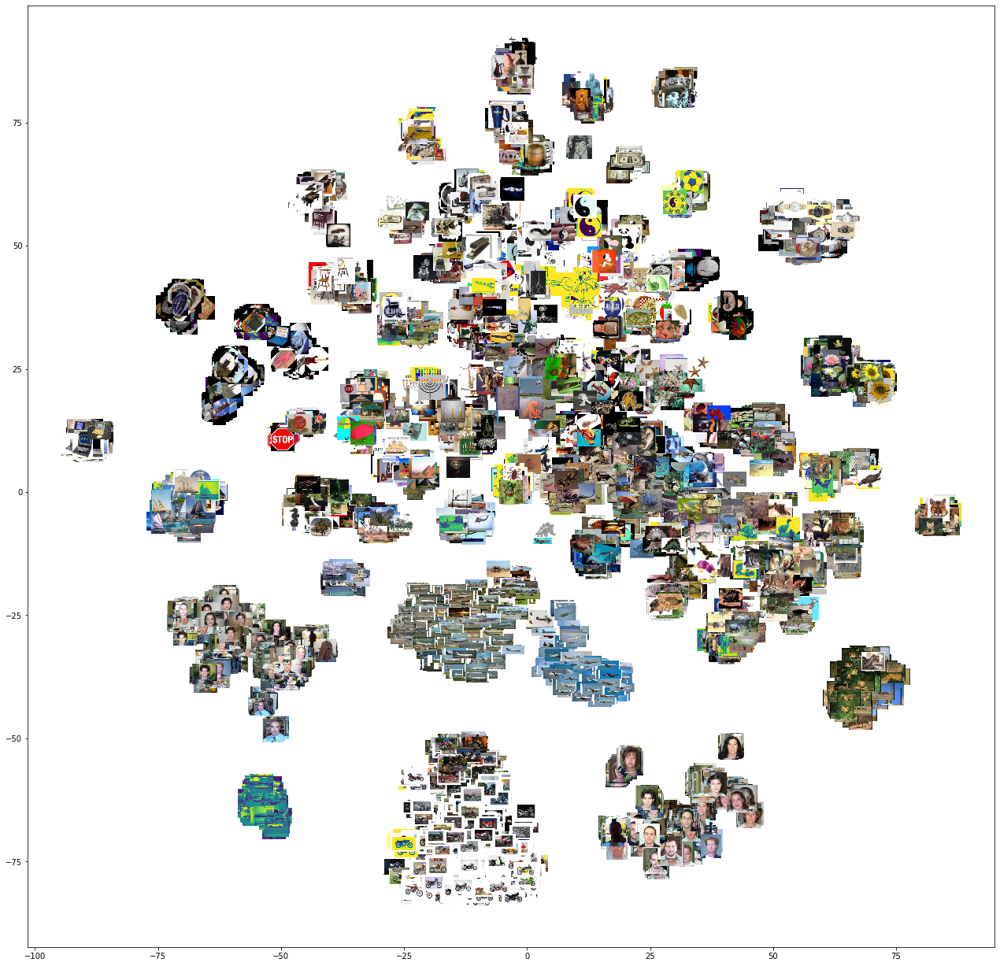

In [35]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

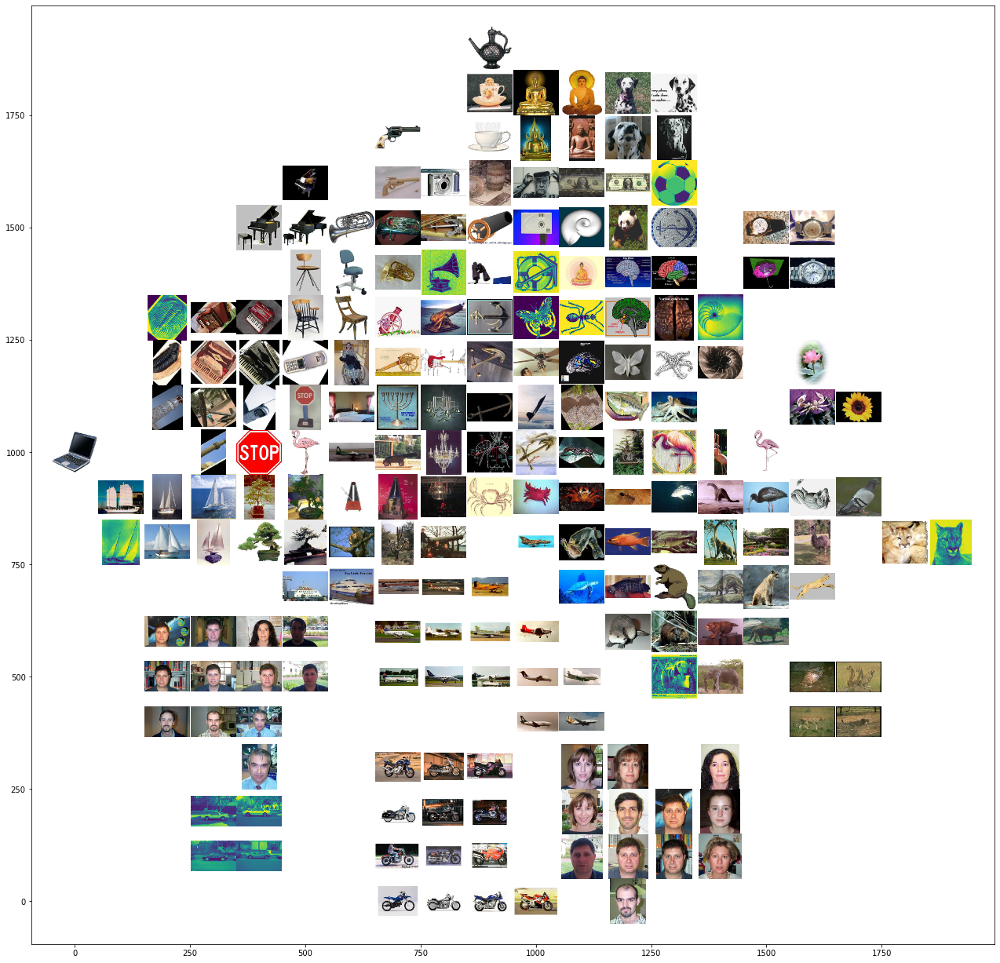

In [36]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

## Wrap Up  
We can use embeddings that are transfer learned on top of existing computer vision models to build a quick and easy reverse-image lookup. We can compress down our features using an algorithm like PCA so that our lookups are faster while maintaining a consistent lookup threshold.